<a href="https://colab.research.google.com/github/farukokumus/YOLOV5_kitti/blob/main/YOLOV5_kitti.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project YOLOV5
Implementation of YOLOV5 and training with reduced KITTI dataset

#Team Members 
FAZLI FARUK OKUMUS-737548 \
MEVLUDE TIGRE-737551

# Import

In [ ]:
import os
import numpy as np
import cv2
from tqdm.notebook import tqdm
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage.transform
%matplotlib inline
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.backends.cudnn as cudnn
from torch.autograd import Variable
import os
import random
import argparse
import torchvision
import torchvision.transforms as transforms
import fileinput
import sys, os
from PIL import Image
from IPython.display import display # to display images
from numpy import save
#from utils.plots import plot_results 

# Mount Google Drive

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Load Data
Upload data given please adopt your file location into code

In [ ]:
store_path = F"/content/drive/MyDrive/PROJECT/Project_detection" #adapt to your file location
x_train = np.load(os.path.join(store_path, "x_train.npy"))
x_test = np.load(os.path.join(store_path, "x_test.npy")) 
y_train = np.load(os.path.join(store_path, "y_train.npy"), allow_pickle=True)

# Get the YOLOV5 repo
Basically clone repository into your local and install requierements if necessary
Additionally, we provide you kitti.yaml file that used for settings, please upload this file into your drive, adopt its file location before before run second code cell in this section...

In [ ]:
if 'google.colab' in sys.modules:
  if os.getcwd() == '/content':
    #clone YOLOv5 and 
    !git clone https://github.com/ultralytics/yolov5  # clone repo
    %cd yolov5
    %pip install -qr requirements.txt # install dependencies


Cloning into 'yolov5'...
remote: Enumerating objects: 12332, done.
remote: Counting objects: 100% (51/51), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 12332 (delta 27), reused 20 (delta 8), pack-reused 12281
Receiving objects: 100% (12332/12332), 12.13 MiB | 10.42 MiB/s, done.
Resolving deltas: 100% (8502/8502), done.
/content/yolov5
     |████████████████████████████████| 596 kB 33.1 MB/s 


In [ ]:
!cp /content/drive/MyDrive/PROJECT/Project_detection/kitti.yaml /content/yolov5/data/kitti.yaml # Please adopt your file location for .yaml file that already provided
os.chdir("/content")

# Convert data to YOLOV5 format
take data loaded and convert to format that yolo wanted...

In [ ]:
#save imgs to yolo format
given_data_length, img_height, img_width, img_channels = x_train.shape
validation_fraction = .2 #train/test split: 80/20
if os.getcwd() == '/content':
  !mkdir -p "kitti/images/train"
  !mkdir -p "kitti/labels/train"
  !mkdir -p "kitti/images/val"
  !mkdir -p "kitti/labels/val"
  !mkdir -p "kitti/images/test"
  os.chdir("kitti")
  val_count = 0
  train_count = 0

In [ ]:
  for dataset_id in tqdm(range(given_data_length)):
    if np.random.rand() <= validation_fraction:
      label_save_path = "labels/val/"
      images_save_path = "images/val/"
      val_count += 1
    else:
      label_save_path = "labels/train/"
      images_save_path = "images/train/"
      train_count += 1

    ## SAVE IMAGE
    img = Image.fromarray(np.uint8(x_train[dataset_id, ...]*255), "RGB")
    img.save(images_save_path + 'img-' + str(dataset_id) + '.jpeg')

    ## SAVE LABEL
    with open(label_save_path + 'img-' + str(dataset_id) + '.txt', 'a') as the_file:
      for object_id in range(len(y_train[dataset_id]["classes"])):
        img_class = y_train[dataset_id]["classes"][object_id]
        img_box = y_train[dataset_id]["boxes"][object_id]
        box_height = (img_box[2] - img_box[0])
        box_width = (img_box[3] - img_box[1])
        box_pos_x = (img_box[1] + box_width/2)  / img_width
        box_pos_y = (img_box[0] + box_height/2)  / img_height
        box_height = (img_box[2] - img_box[0]) / img_height
        box_width = (img_box[3] - img_box[1]) / img_width
        if (box_pos_x >= 0 and box_pos_y >= 0) and (box_pos_x <= 1 and box_pos_y <= 1):
          the_file.write(str(img_class) + " " + str(box_pos_x) + " " + str(box_pos_y) + " " + str(box_width) + " " + str(box_height) + '\n')
  ## PRINT THE FRACTION
  print("Training data percent: "+str(100*train_count/(train_count+val_count)) + ", Validation data percent: "+str(+100*val_count/(train_count+val_count)))

  0%|          | 0/3712 [00:00<?, ?it/s]

Training data percent: 79.06788793103448, Validation data percent: 20.932112068965516


In [ ]:
test_data_length, _, _, _ = x_test.shape
test_images_save_path="images/test/"
for test_data_idx in tqdm(range(test_data_length)):
    ## SAVE TEST IMAGE
    img = Image.fromarray(np.uint8(x_test[test_data_idx, ...]*255), "RGB")
    img.save(test_images_save_path + 'img-' + str(test_data_idx) + '.jpeg')
os.chdir("..")

  0%|          | 0/3769 [00:00<?, ?it/s]

# TensorBoard Debugger

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

# Weight and Biases Debug Console
Please login your credentials instead of ours, to get logs real time ... :)


In [ ]:
# Weights & Biases  (optional)
%pip install -q wandb
import wandb
wandb.login(key="00bcf1d7fa912c93e2a96b85b0d872a732f8a885") # you can go tps://wandb.ai/authorize and get your own key

     |████████████████████████████████| 1.8 MB 33.0 MB/s 
     |████████████████████████████████| 145 kB 67.6 MB/s 
     |████████████████████████████████| 181 kB 71.2 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

# TRAIN

In [ ]:
os.chdir("/content/yolov5")
!python train.py --img 320 --batch 32 --epochs 35 --data kitti.yaml --weights yolov5l.pt --cache

wandb: Currently logged in as: fokumus. Use `wandb login --relogin` to force relogin
train: weights=yolov5l.pt, cfg=, data=kitti.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=35, batch_size=32, imgsz=320, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-267-g50ff6ee Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0,

In [ ]:
%cp /content/yolov5/runs/train/yolov5l_results_final/weights/best.pt /content/drive/MyDrive/PROJECT/Project_detection

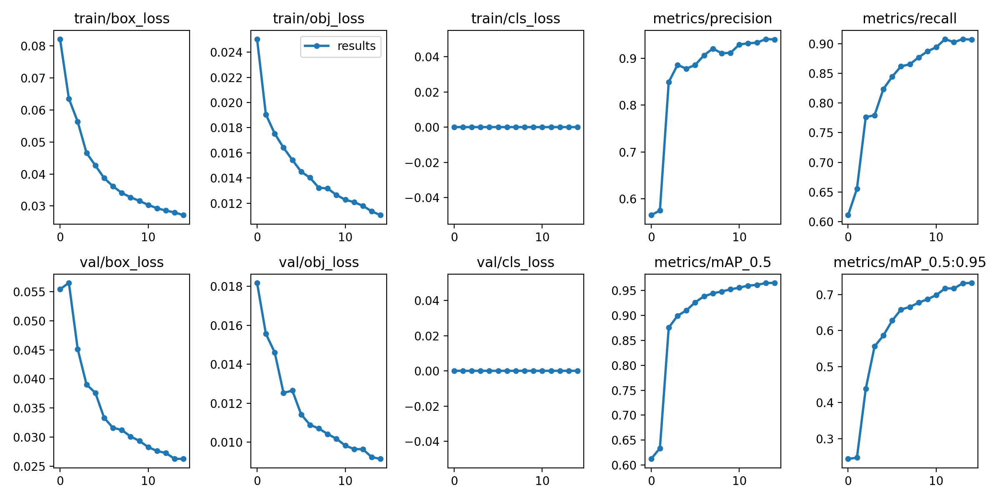

##########################################################################################################################################################


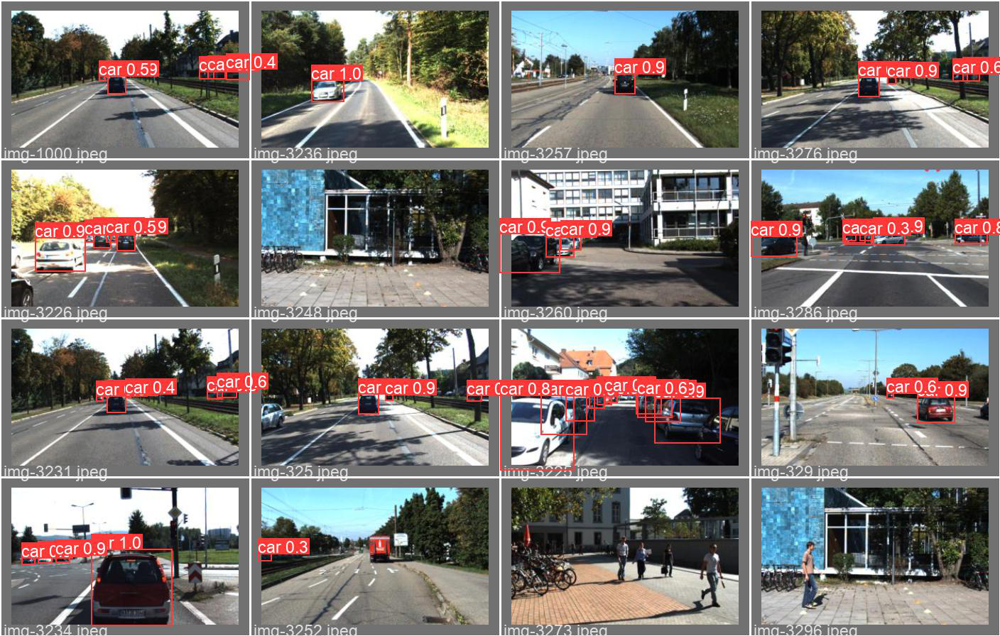

##########################################################################################################################################################


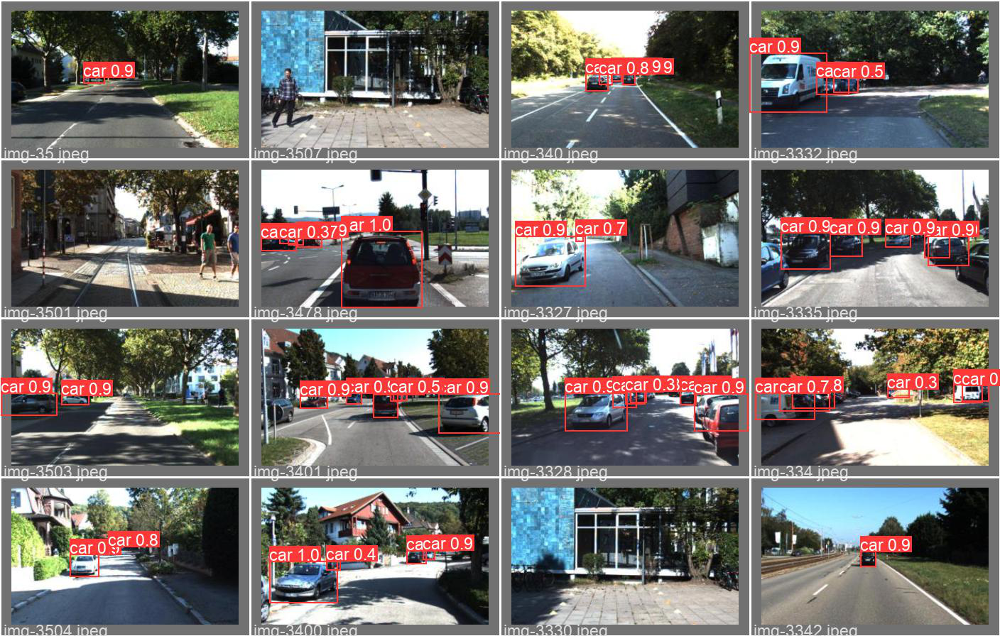

##########################################################################################################################################################


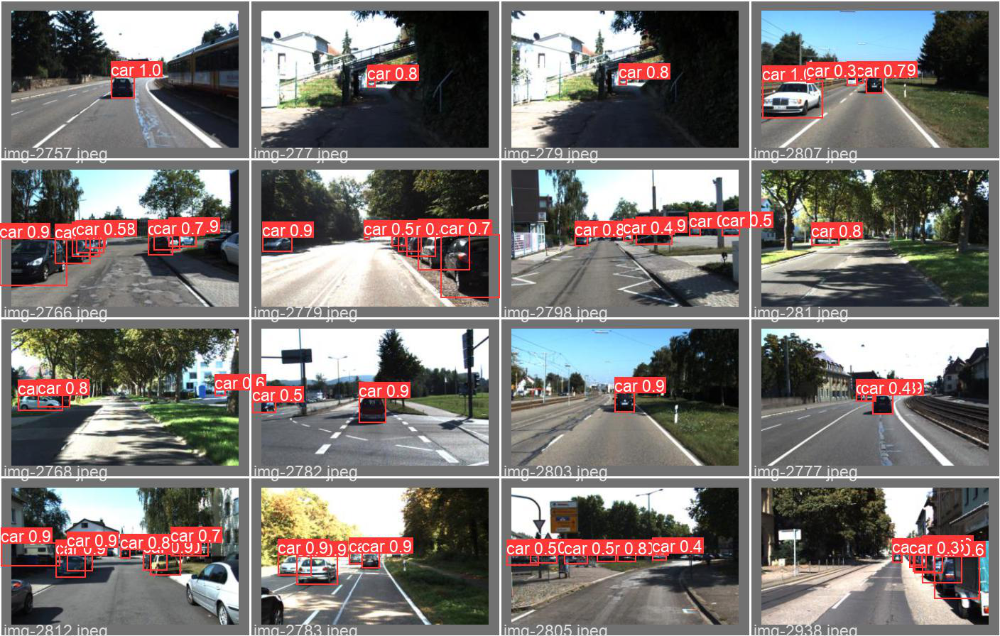

In [ ]:
from utils.plots import plot_results 
plot_results('/content/yolov5/runs/train/exp/results.csv')
from IPython.display import display # to display images
im = Image.open('/content/yolov5/runs/train/exp/results.png')
display(im)
for i in range(3):
  #im = Image.open('/content/yolov5/runs/train/exp/train_batch'+str(i)+'.jpg')
  print("##########################################################################################################################################################")
  display(Image.open('/content/yolov5/runs/train/exp/val_batch'+str(i)+'_pred.jpg'))


os.chdir("..")

# TEST 

In [ ]:
os.chdir("/content/yolov5")
!python detect.py --weights runs/train/exp/weights/best.pt --img 320 --conf 0.25 --save-txt --save-conf --save-crop --source /content/kitti/images/test

# Setup prediction result's file

In [ ]:
# create the dictionary format
# boxes, classes and scores are numpy.ndarray type
def dict_format(boxes, classes, scores):
  # create empty dictionary
  pred_dict = {}
  # save the corresponding boxes, classes and scores
  pred_dict["boxes"] = boxes
  pred_dict["classes"] = classes
  pred_dict["scores"] = scores
  return pred_dict

In [ ]:
# convert bounding box format from yolo to voc
def yolo_to_voc(x_center, y_center, width, height, img_width, img_height):
  box_height = height * img_height
  box_width = width * img_width
  ymin = int((y_center * img_height) - (box_height / 2.0))
  xmin = int((x_center * img_width) - (box_width / 2.0))
  ymax = int(box_height + ymin)
  xmax = int(box_width + xmin)
  return [ymin, xmin, ymax, xmax]

In [ ]:
# store predictions in numpy.ndarray 
model_pred_test = np.zeros(shape = (x_test.shape[0], ), dtype=object)
predicted_img_number = 0
for i in range(x_test.shape[0]):
  boxes = []
  classes = []
  scores = []
  
  the_path = "img-" + str(i) + ".txt"
  full_path = "/content/yolov5/runs/detect/exp/labels/" + the_path
  # read the corresponding path
  try:
    with open(full_path) as f:
      matrix=[line.split() for line in f]
      # split each line
      for j in range(len(matrix)):
        # save the class
        classes.append(matrix[j][0])
        # convert bounding box yolo to voc format and save it in boxes
        y_min, x_min, y_max, x_max = yolo_to_voc(float(matrix[j][1]), float(matrix[j][2]), float(matrix[j][3]), float(matrix[j][4]), img_width, img_height)
        boxes.append([y_min, x_min, y_max, x_max])
        # save the prediction score
        scores.append(round(float(matrix[j][5]), 1))
    print(the_path, "is converted")
    predicted_img_number += 1
    # close the file
    f.close()
    # convert to numpy arrays
    boxes = np.array(boxes).astype(np.int)
    classes = np.array(classes).astype(np.float)
    scores = np.array(scores).astype(np.float)
    # save classes, boxes and scores in the dictionary
    #model_pred_test[i] = dict_format(np.array(boxes).astype(np.int), np.array(classes).astype(np.float), np.array(scores).astype(np.float))
  # if you can read it, it is empty
  except:
    print("no prediction for corresponding test image index", str(i))
  # save classes, boxes and scores in the dictionary
  model_pred_test[i] = dict_format(boxes, classes, scores)
  
print(predicted_img_number, "test images are predicted out of", x_test.shape[0])

In [ ]:
# save the predictions as npy
store_path = F"/content/drive/MyDrive/PROJECT/Project_detection/pred_data_test_new.npy"
np.save(store_path, model_pred_test) # save

# Visualization

In [ ]:
# our prediction
# read prediction
store_path = F"/content/drive/MyDrive/PROJECT/Project_detection/pred_data_test_new.npy"
pred_test = np.load(store_path, allow_pickle=True)


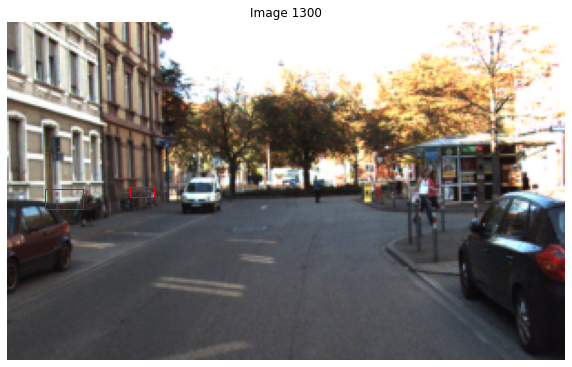

In [ ]:
%matplotlib inline
# Colormap for plotted bounding boxes 
cmap = {0: "r", "Pedestrian": "g", "Cyclist": "b", "Van": "yellow", "Truck": "black"}
#we deleted labels other than cars

# Get boxes & classes for specific image
im_number = 1300
boxes = pred_test[im_number]["boxes"]
classes = pred_test[im_number]["classes"]

# Plot image
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
ax.imshow(x_train[im_number, ...])
ax.axis("off")
plt.title(f"Image {im_number}")

# Plot colored bounding boxes
for bbox, cls in zip(boxes, classes):
    try:
        cl = cmap[cls]
    except:
        cl = cmap["Misc"]
    # Add rectangle (x,y), width, heigth
    height = bbox[2] - bbox[0]
    width = bbox[3] - bbox[1]
    rect = patches.Rectangle((bbox[1], bbox[0]), width, height, linewidth=1, edgecolor=cl, facecolor="none")
    ax.add_patch(rect)